# Sequential learning with CAMD

**Objective:** imagine you want to design a procedure in order to discover materials which are resistant to deformation.  Such efforts have been the subject of at least one [recent paper](https://pubs.acs.org/doi/10.1021/jacs.8b02717) which used machine learning to predict and verify a new superhard material, (ReWC0.8).  How would we design a method that iterated on each of its past experiments in order to improve itself?  In this notebook, we cover methods supported by [CAMD](https://s3-eu-west-1.amazonaws.com/itempdf74155353254prod/11860104/Autonomous_Intelligent_Agents_for_Accelerated_Materials_Discovery_v1.pdf), a software package designed to assist scientists with sequential learning, that will reveal how different methods of decision making and feedback perform on a known dataset of materials.

In [1]:
import pandas as pd

## Preprocessing data
The dataset we'll be using in the tutorial will be the elastic tensor dataset from Maarten de Jong's 2015 paper, [Charting the complete elastic properties of inorganic crystalline compounds](https://www.nature.com/articles/sdata20159).  We'll be using the [MatMiner](https://hackingmaterials.lbl.gov/matminer/) API to fetch the data, which we've written a function for in the helper code pre-installed on your SageMaker instance.  In order to make our data compatible with some machine learning functionality later on, we'll be featurizing it, also using MatMiner.  Lastly, we'll lay the groundwork for the simulation of our sequential learning procedure by separating the featurized data into **seed_data** which we will assume we have full knowledge of a-priori, and **candidate_data** which we will assume we know nothing about.

In [2]:
# Load the data
from hackathon.helper import load_tutorial_data
data = load_tutorial_data()
# Inspect the first five rows
data.head()

,formula,space_group,shear_modulus,bulk_modulus
material_id,,,,
mp-10003,Nb4CoSi,124,97.1,194.3
mp-10010,Al(CoSi)2,164,96.3,175.4
mp-10015,SiOs,221,130.1,295.1
mp-10021,Ga,63,15.1,49.1
mp-10025,SiRu2,62,101.9,256.8


In [3]:
# Sort the data and inspect again
data = data.sort_values('bulk_modulus', ascending=False)
data.head()

,formula,space_group,shear_modulus,bulk_modulus
material_id,,,,
mp-611426,C,194,522.9,435.7
mp-49,Os,194,258.7,401.3
mp-1894,WC,187,279.0,385.2
mp-8,Re,194,173.1,365.1
mp-30745,Ir3W,194,193.3,351.3


In [4]:
data.tail()

,formula,space_group,shear_modulus,bulk_modulus
material_id,,,,
mp-56,Ba,194,3.4,8.0
mp-127,Na,229,3.2,7.5
mp-614603,CsI,225,3.9,7.4
mp-569289,Hg,229,2.7,7.2
mp-571222,CsBr,225,4.6,6.5


In [5]:
## Generate magpie features
from matminer.featurizers.composition import ElementProperty
from pymatgen import Composition

data['composition'] = data['formula'].apply(Composition)
featurizer = ElementProperty.from_preset("magpie")
featurized_data = featurizer.featurize_dataframe(data, 'composition')

In [6]:
featurized_data.head()

,formula,space_group,shear_modulus,bulk_modulus,composition,MagpieData minimum Number,MagpieData maximum Number,MagpieData range Number,MagpieData mean Number,MagpieData avg_dev Number,...,MagpieData range GSmagmom,MagpieData mean GSmagmom,MagpieData avg_dev GSmagmom,MagpieData mode GSmagmom,MagpieData minimum SpaceGroupNumber,MagpieData maximum SpaceGroupNumber,MagpieData range SpaceGroupNumber,MagpieData mean SpaceGroupNumber,MagpieData avg_dev SpaceGroupNumber,MagpieData mode SpaceGroupNumber
material_id,,,,,,,,,,,,,,,,,,,,,
mp-611426,C,194,522.9,435.7,(C),6.0,6.0,0.0,6.00,0.000,...,0.0,0.0,0.0,0.0,194.0,194.0,0.0,194.0,0.0,194.0
mp-49,Os,194,258.7,401.3,(Os),76.0,76.0,0.0,76.00,0.000,...,0.0,0.0,0.0,0.0,194.0,194.0,0.0,194.0,0.0,194.0
mp-1894,WC,187,279.0,385.2,"(W, C)",6.0,74.0,68.0,40.00,34.000,...,0.0,0.0,0.0,0.0,194.0,229.0,35.0,211.5,17.5,194.0
mp-8,Re,194,173.1,365.1,(Re),75.0,75.0,0.0,75.00,0.000,...,0.0,0.0,0.0,0.0,194.0,194.0,0.0,194.0,0.0,194.0
mp-30745,Ir3W,194,193.3,351.3,"(Ir, W)",74.0,77.0,3.0,76.25,1.125,...,0.0,0.0,0.0,0.0,225.0,229.0,4.0,226.0,1.5,225.0


Here we partition the data by choosing every other member of our known data for the seed data and the remainder for our candidate data.  Note that this partitioning can have a **significant** impact on how the sequential learning procedure progresses.  As an exercise, you might try seeing how the notebook compares if you use the alternative commented option where the seed is the bottom half of the dataset.

In [7]:
# Partition data into seed and candidate data
k_seed_data = featurized_data.iloc[::2]
k_candidate_data = featurized_data.iloc[1::2]
k_candidate_data.drop(['bulk_modulus', 'shear_modulus'], axis=1)

,formula,space_group,composition,MagpieData minimum Number,MagpieData maximum Number,MagpieData range Number,MagpieData mean Number,MagpieData avg_dev Number,MagpieData mode Number,MagpieData minimum MendeleevNumber,...,MagpieData range GSmagmom,MagpieData mean GSmagmom,MagpieData avg_dev GSmagmom,MagpieData mode GSmagmom,MagpieData minimum SpaceGroupNumber,MagpieData maximum SpaceGroupNumber,MagpieData range SpaceGroupNumber,MagpieData mean SpaceGroupNumber,MagpieData avg_dev SpaceGroupNumber,MagpieData mode SpaceGroupNumber
material_id,,,,,,,,,,,,,,,,,,,,,
mp-49,Os,194,(Os),76.0,76.0,0.0,76.00,0.000,76.0,57.0,...,0.0,0.0,0.0,0.0,194.0,194.0,0.0,194.0,0.0,194.0
mp-8,Re,194,(Re),75.0,75.0,0.0,75.00,0.000,75.0,54.0,...,0.0,0.0,0.0,0.0,194.0,194.0,0.0,194.0,0.0,194.0
mp-2305,MoC,187,"(Mo, C)",6.0,42.0,36.0,24.00,18.000,6.0,50.0,...,0.0,0.0,0.0,0.0,194.0,229.0,35.0,211.5,17.5,194.0
mp-11482,MoIr3,194,"(Mo, Ir)",42.0,77.0,35.0,68.25,13.125,77.0,50.0,...,0.0,0.0,0.0,0.0,225.0,229.0,4.0,226.0,1.5,225.0
mp-30744,IrW,51,"(Ir, W)",74.0,77.0,3.0,75.50,1.500,74.0,51.0,...,0.0,0.0,0.0,0.0,225.0,229.0,4.0,227.0,2.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
mp-95,Sr,229,(Sr),38.0,38.0,0.0,38.00,0.000,38.0,8.0,...,0.0,0.0,0.0,0.0,225.0,225.0,0.0,225.0,0.0,225.0
mp-22898,KI,225,"(K, I)",19.0,53.0,34.0,36.00,17.000,19.0,3.0,...,0.0,0.0,0.0,0.0,64.0,229.0,165.0,146.5,82.5,64.0
mp-10172,Na,194,(Na),11.0,11.0,0.0,11.00,0.000,11.0,2.0,...,0.0,0.0,0.0,0.0,229.0,229.0,0.0,229.0,0.0,229.0


In [8]:
# Alternative: choose bottom half
# half = int(len(featurized_data) / 2)
# k_seed_data = featurized_data.iloc[half:]
# k_candidate_data = featurized_data.iloc[:half]
# k_candidate_data.drop(['bulk_modulus', 'shear_modulus'], axis=1)

# Alternative: choose randomly
# half = int(len(featurized_data) / 2)
# k_seed_data = featurized_data.sample(half)
# k_candidate_data = featurized_data.loc[~k_seed_data]
# k_candidate_data.drop(['bulk_modulus', 'shear_modulus'], axis=1)

In [9]:
# test to ensure no overlap
assert not set(k_seed_data.index).intersection(k_candidate_data.index)  

## Agents

In CAMD, Hypothesis *Agents* are python objects which select candidates on which to perform experiments.  Almost all of the "AI" components, including ML algorithms, simpler regression, and even random selection, within CAMD are contained in logic implemented within Agents.  


To implement a CAMD-compatible Agent, we use the *HypothesisAgent* abstract class, which basically will issue an error if we don't fulfill all of the things we need to in order to ensure that our Agent is compatible with the sequential learning process implemented in a CAMD *Campaign* (more on Campaigns later).

In [10]:
from camd.agent.base import HypothesisAgent
from sklearn.linear_model import LinearRegression

def get_magpie_features(dataframe):
    magpie_columns = [column for column in dataframe 
                      if column.startswith("MagpieData")]
    return dataframe[magpie_columns]

In [11]:
class LinearHardnessAgent(HypothesisAgent):
    def get_hypotheses(self, candidate_data, seed_data):
        # Fit on known data
        x_known = get_magpie_features(seed_data)
        y_known = seed_data['bulk_modulus']
        print(x_known.shape)
        print(y_known.shape)
        regressor = LinearRegression()
        regressor.fit(x_known, y_known)
        
        # Predict unknown data
        x_unknown = get_magpie_features(candidate_data)
        y_predicted = regressor.predict(x_unknown)
        
        # Pick top 5 candidates
        candidate_data['bulk_modulus_pred'] = y_predicted
        candidate_data = candidate_data.sort_values(
            'bulk_modulus_pred', ascending=False)
        top_candidates = candidate_data.head(5)
        return top_candidates

Let's play with the Agent a bit to see what it recommends.

In [12]:
lh_agent = LinearHardnessAgent()
hypotheses = lh_agent.get_hypotheses(k_candidate_data, k_seed_data)
hypotheses[['formula', 'bulk_modulus', 'bulk_modulus_pred']]

(591, 132)
(591,)


,formula,bulk_modulus,bulk_modulus_pred
material_id,,,
mp-49,Os,401.3,363.813384
mp-2305,MoC,349.8,359.322705
mp-91,W,303.9,346.480631
mp-1086,TaC,323.9,332.915230
mp-8,Re,365.1,331.337852


In [13]:
data.head()

,formula,space_group,shear_modulus,bulk_modulus,composition
material_id,,,,,
mp-611426,C,194,522.9,435.7,(C)
mp-49,Os,194,258.7,401.3,(Os)
mp-1894,WC,187,279.0,385.2,"(W, C)"
mp-8,Re,194,173.1,365.1,(Re)
mp-30745,Ir3W,194,193.3,351.3,"(Ir, W)"


### Exercise - Use a random forest regression
How do its selections from our dataset differ?

In [14]:
### Implement agent here
from sklearn.ensemble import RandomForestRegressor

class RFHardnessAgent(HypothesisAgent):
    def get_hypotheses(self, candidate_data, seed_data):
        # Fit on known data
        x_known = get_magpie_features(seed_data)
        y_known = seed_data['bulk_modulus']
        regressor = RandomForestRegressor(n_estimators=10)
        regressor.fit(x_known, y_known)
        
        # Predict unknown data
        x_unknown = get_magpie_features(candidate_data)
        y_predicted = regressor.predict(x_unknown)
        
        # Pick top 5 candidates
        candidate_data['bulk_modulus_pred'] = y_predicted
        candidate_data = candidate_data.sort_values(
            'bulk_modulus_pred', ascending=False)
        top_candidates = candidate_data.head(5)
        return top_candidates

In [15]:
### Test agent here
agent = RFHardnessAgent()
hypotheses = agent.get_hypotheses(featurized_data, featurized_data)
hypotheses[['formula', 'bulk_modulus', 'bulk_modulus_pred']]

,formula,bulk_modulus,bulk_modulus_pred
material_id,,,
mp-49,Os,401.3,384.940000
mp-101,Ir,346.3,341.490000
mp-8,Re,365.1,340.730000
mp-2305,MoC,349.8,340.523333
mp-30745,Ir3W,351.3,337.220000


In [16]:
data.head(10)

,formula,space_group,shear_modulus,bulk_modulus,composition
material_id,,,,,
mp-611426,C,194,522.9,435.7,(C)
mp-49,Os,194,258.7,401.3,(Os)
mp-1894,WC,187,279.0,385.2,"(W, C)"
mp-8,Re,194,173.1,365.1,(Re)
mp-30745,Ir3W,194,193.3,351.3,"(Ir, W)"
mp-2305,MoC,187,239.8,349.8,"(Mo, C)"
mp-101,Ir,225,216.5,346.3,(Ir)
mp-11482,MoIr3,194,187.7,337.0,"(Mo, Ir)"
mp-567397,W2C,162,165.7,335.8,"(W, C)"


## Experiments

In CAMD, *Experiments* are objects that are used to generate new data corresponding to the output of the *Agent.get_hypotheses* method.  In other words, *Agents* pick the candidates on which you want to do experiments, and *Experiments* actually do those experiments.  As of today, only two experiments are implemented in CAMD, one of which is a AWS-based density functional theory computation of an input crystal structure.  The other, which we'll demonstrate below, is an *after-the-fact sampler*, which basically fetches the result of an experiment we already did that corresponds to the input.

Why is the ATFSampler useful?  We'll discuss simulation in more detail in a bit, but let's just say we use the ATFSampler to help us evaluate the performance of an Agent when we're trying to pick which agent is the best!

In [17]:
from camd.experiment.base import ATFSampler

In [18]:
k_atf_experiment = ATFSampler(dataframe=featurized_data)

Note that experiments are *stateful* meaning that their state is explicitly controlled by the user using the `submit` method.  When a new set of experiments are submitted, the previous experiments are appended to an internal history attribute and the new ones are set as the current experiments.

In [19]:
k_atf_experiment.submit(hypotheses)
results = k_atf_experiment.get_results()
results

,formula,space_group,shear_modulus,bulk_modulus,composition,MagpieData minimum Number,MagpieData maximum Number,MagpieData range Number,MagpieData mean Number,MagpieData avg_dev Number,...,MagpieData mean GSmagmom,MagpieData avg_dev GSmagmom,MagpieData mode GSmagmom,MagpieData minimum SpaceGroupNumber,MagpieData maximum SpaceGroupNumber,MagpieData range SpaceGroupNumber,MagpieData mean SpaceGroupNumber,MagpieData avg_dev SpaceGroupNumber,MagpieData mode SpaceGroupNumber,bulk_modulus_pred
material_id,,,,,,,,,,,,,,,,,,,,,
mp-49,Os,194,258.7,401.3,(Os),76.0,76.0,0.0,76.00,0.000,...,0.0,0.0,0.0,194.0,194.0,0.0,194.0,0.0,194.0,384.940000
mp-101,Ir,225,216.5,346.3,(Ir),77.0,77.0,0.0,77.00,0.000,...,0.0,0.0,0.0,225.0,225.0,0.0,225.0,0.0,225.0,341.490000
mp-8,Re,194,173.1,365.1,(Re),75.0,75.0,0.0,75.00,0.000,...,0.0,0.0,0.0,194.0,194.0,0.0,194.0,0.0,194.0,340.730000
mp-2305,MoC,187,239.8,349.8,"(Mo, C)",6.0,42.0,36.0,24.00,18.000,...,0.0,0.0,0.0,194.0,229.0,35.0,211.5,17.5,194.0,340.523333
mp-30745,Ir3W,194,193.3,351.3,"(Ir, W)",74.0,77.0,3.0,76.25,1.125,...,0.0,0.0,0.0,225.0,229.0,4.0,226.0,1.5,225.0,337.220000


## Analyzers

**Analyzers** are a bit tricky to explain because they're not necessary for every sequential learning process.  We're not going to spend much time on them here other than to say that, after you've performed an experiment, sometimes you want to postprocess the data in order to summarize the results of the current iteration and to augment the **seed data** which is being used to provide the **Agent** with the information it needs to make its next decision on which candidates to select for further experiments.

In [20]:
from camd.analysis import AnalyzerBase

In [21]:
class BandgapAnalyzer(AnalyzerBase):
    def analyze(self, new_experimental_results, seed_data):
        new_seed = pd.concat(
            [seed_data, new_experimental_results],
        axis=0)
        # Create a summary
        average_new_bandgap = new_experimental_results.bandgap.median()
        average_dataset_bandgap = new_seed.bandgap.median()
        new_result_ranks = new_seed.bandgap.rank(pct=True).loc[
            new_experimental_results.index
        ]
        summary = pd.DataFrame({
            "average_new_bulk_modulus": [average_new_bulk_modulus],
            "average_dataset_bulk_modulus": [average_dataset_bulk_modulus],
            "average_rank": [new_result_ranks.mean()]
        })
        return summary, new_seed

In [31]:
k_analyzer = BulkModulusAnalyzer()
summary, new_seed = k_analyzer.analyze(results, k_seed_data)

In [32]:
summary

,average_new_bulk_modulus,average_dataset_bulk_modulus,average_rank
0,362.76,138.233054,0.99185


## Data, Campaigns, and Simulations

Now that we've got all of the building blocks in place, let's try putting everything together!

In [24]:
import os
from monty.os import cd
from camd.campaigns.base import Campaign
# Set up folders
os.system('rm -rf test')
os.system('mkdir -p test')
# Reinitialize experiment to clear history
k_atf_experiment = ATFSampler(dataframe=featurized_data)
with cd('test'):
    campaign = Campaign(
        candidate_data=k_candidate_data, 
        seed_data=k_seed_data,
        agent=lh_agent,
        experiment=k_atf_experiment,
        analyzer=k_analyzer
    )
    campaign.auto_loop(initialize=True)

Campaign initialization state: Agent LinearHardnessAgent hypothesizing
Campaign 0 state: Running experiments
Iteration: 0
Campaign 0 state: Getting new results
Campaign 0 state: Analyzing results
Campaign 0 state: Agent LinearHardnessAgent hypothesizing
Campaign 0 state: Running experiments
  Waiting for next round ...
Iteration: 1
Campaign 1 state: Getting new results
Campaign 1 state: Analyzing results
Campaign 1 state: Agent LinearHardnessAgent hypothesizing
Campaign 1 state: Running experiments
  Waiting for next round ...
Iteration: 2
Campaign 2 state: Getting new results
Campaign 2 state: Analyzing results
Campaign 2 state: Agent LinearHardnessAgent hypothesizing
Campaign 2 state: Running experiments
  Waiting for next round ...
Iteration: 3
Campaign 3 state: Getting new results
Campaign 3 state: Analyzing results
Campaign 3 state: Agent LinearHardnessAgent hypothesizing
Campaign 3 state: Running experiments
  Waiting for next round ...
Iteration: 4
Campaign 4 state: Getting new 

In [25]:
# Pull up some results
history = pd.read_pickle('test/history.pickle')

In [26]:
history

,average_new_bulk_modulus,average_dataset_bulk_modulus,average_rank
0,350.70,138.131879,0.988926
1,308.72,139.551082,0.971547
2,286.98,140.767492,0.953135
3,262.86,141.766612,0.927660
4,261.02,142.734578,0.909740
5,247.46,143.577778,0.842029
6,246.96,144.403514,0.874760
7,234.58,145.118067,0.851664
8,237.38,145.843396,0.864151
9,217.42,146.401716,0.792824


array([<matplotlib.axes._subplots.AxesSubplot object at 0x129592f10>,
      dtype=object)

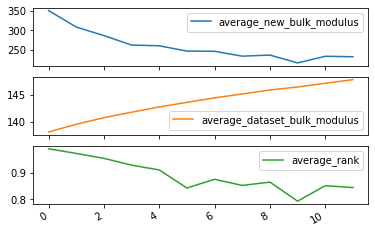

In [27]:
history.plot(subplots=True)

In [28]:
# Introspect on experiment history
_, result_history = k_atf_experiment.agg_history

In [29]:
result_history.head()

,formula,space_group,shear_modulus,bulk_modulus,composition,MagpieData minimum Number,MagpieData maximum Number,MagpieData range Number,MagpieData mean Number,MagpieData avg_dev Number,...,MagpieData mean GSmagmom,MagpieData avg_dev GSmagmom,MagpieData mode GSmagmom,MagpieData minimum SpaceGroupNumber,MagpieData maximum SpaceGroupNumber,MagpieData range SpaceGroupNumber,MagpieData mean SpaceGroupNumber,MagpieData avg_dev SpaceGroupNumber,MagpieData mode SpaceGroupNumber,bulk_modulus_pred
material_id,,,,,,,,,,,,,,,,,,,,,
mp-49,Os,194,258.7,401.3,(Os),76.0,76.0,0.0,76.000000,0.000000,...,0.0,0.0,0.0,194.0,194.0,0.0,194.000000,0.000000,194.0,384.940000
mp-2305,MoC,187,239.8,349.8,"(Mo, C)",6.0,42.0,36.0,24.000000,18.000000,...,0.0,0.0,0.0,194.0,229.0,35.0,211.500000,17.500000,194.0,340.523333
mp-91,W,229,147.3,303.9,(W),74.0,74.0,0.0,74.000000,0.000000,...,0.0,0.0,0.0,229.0,229.0,0.0,229.000000,0.000000,229.0,300.670000
mp-8,Re,194,173.1,365.1,(Re),75.0,75.0,0.0,75.000000,0.000000,...,0.0,0.0,0.0,194.0,194.0,0.0,194.000000,0.000000,194.0,340.730000
mp-684602,W2C,58,169.4,333.4,"(W, C)",6.0,74.0,68.0,51.333333,30.222222,...,0.0,0.0,0.0,194.0,229.0,35.0,217.333333,15.555556,229.0,334.113333


In [30]:
k_candidate_data.style.apply(
    lambda x: ['background: darkorange' 
               if (x.name in result_history.index)
               else '' for i in x], axis=1)

## Final thoughts
There's a lot more that we can do to improve our postprocessing analysis of how well the campaign proceeded, but this should get you started.  A few exercises you might find interesting to try:

* Test different regressors from scikit learn, this [documentation of their supervised learning methods](https://scikit-learn.org/stable/supervised_learning.html) points to many of them.
* Test the agent on using multiple random seeds and determine the spread on discovery rate.
* Develop an explore/exploit strategy where you choose some candidates from the regressor prediction and some randomly.
* Try different datasets, see the datasets folder or the [matminer datasets documentation](https://hackingmaterials.lbl.gov/matminer/dataset_summary.html).
* Try different featurizers, see [the matminer featurizer documentation](https://hackingmaterials.lbl.gov/matminer/featurizer_summary.html)

## Glossary
* **Agent** - decision making object in camd, must implement `get_hypotheses` in order to work properly in the loop
* **Experiment** - object which performs some action in order to determine unknowns about an input dataset
* **Analyzer** - object which postprocesses experimental outputs and prior seed data in order to provide a new seed data
* **seed_data** - Data which is "known" either before the start of a given **Campaign** or prior to any iteration.  Is used to inform the **Agent** of the data it should be using to make a decision about how to select from the **Candidate data**.
* **candidate_data** - data which represents the information about the set of "unknowns" at a given point of time for a **Campaign**.
* **Campaign** - the iterative procedure by which an **Agent** suggests experiments from the **candidate data**, the **Experiment** performs them, the **Analyzer** analyzes them and feeds a new **seed data** and set of **candidate data** back to the **Agent** to start a new iteration. 